In [1]:
import numpy as np
import scanpy as sc
import pandas as pd
import os 


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.8.1 pandas==1.4.2 scikit-learn==1.1.1 statsmodels==0.13.2 python-igraph==0.9.10 louvain==0.7.1 pynndescent==0.5.7


Read in the AnnData file.

In [3]:
os.chdir("/Users/fabiola.curion/Documents/projects/donor_deconvolution/deconvolution-project_start")
adata = sc.read_h5ad("filtered_MS_nuclei_hashing_gx38.h5ad")
print(adata)

AnnData object with n_obs × n_vars = 13184 × 33694
    var: 'gene_ids', 'feature_types'


Read in the hashing labels as well as the doublet and donor labels by Hagen pipeline's rescue mode.

In [4]:
obs = pd.read_csv("gx38_final_result_all.csv")
obs

,Barcode,donor_identity
0,TCATGAGTCACCACAA-1,Hash454-TotalSeqA
1,ACTTATCCATTCCTCG-1,doublet
2,ATAGAGACAACAACAA-1,Hash453-TotalSeqA
3,GTAAGTCTCTTCACAT-1,Hash453-TotalSeqA
4,TCGAAGTTCAAACGTC-1,Hash456-TotalSeqA
...,...,...
13179,CCGGACACAAAGCACG-1,Hash452-TotalSeqA
13180,TCCGGGAAGAAGAGCA-1,negative
13181,TCGAAGTCAAATGAAC-1,negative
13182,CTGTACCAGAACTTCC-1,Hash455-TotalSeqA


In [5]:
obs_vario = pd.read_csv(
    "gx38_vireo_assignment.csv", 
    usecols=["cell", "donor_id", "classification"])
obs_vario

,cell,donor_id,classification
0,AAACCCAAGGATGAGA-1,donor0,singlet
1,AAACCCAAGGTACCTT-1,unassigned,unassigned
2,AAACCCAAGTCATTGC-1,donor0,singlet
3,AAACCCAAGTTGGAGC-1,donor3,singlet
4,AAACCCACAAGGCTTT-1,donor3,singlet
...,...,...,...
13179,TTTGTTGTCCACTTTA-1,donor3,singlet
13180,TTTGTTGTCCCTCTAG-1,donor1,singlet
13181,TTTGTTGTCCGTACGG-1,donor5,singlet
13182,TTTGTTGTCGCTTGAA-1,donor5,singlet


Read in the metadata created by Grant-Peters et al. for the previously analyzed cells.

In [6]:
obs_meta_all = pd.read_csv("adataobs_MSmultiplex_DendrouSchirmerJakel_integrated.csv", index_col=0, low_memory=False)
obs_meta_all.head()

,sample_id,batch,antibody,library_id,patient,block_position,demult_sample_id,disorder,disease_type,age,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
AAACGCTTCGTAGGAG-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
AAAGGATTCATGCGGC-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
AAAGGATTCGCTTAAG-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
AAAGGTAAGGCCTTCG-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes
AACAAAGTCCGATAAC-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes


Set Index of metadata as a column. Cut all information after barcode.

In [7]:
obs_meta_all.reset_index(inplace=True)
obs_meta_all['index'] = obs_meta_all['index'].str[:18]
obs_meta_all.head()

,index,sample_id,batch,antibody,library_id,patient,block_position,demult_sample_id,disorder,disease_type,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
0,AAACGCTTCGTAGGAG-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
1,AAAGGATTCATGCGGC-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
2,AAAGGATTCGCTTAAG-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
3,AAAGGTAAGGCCTTCG-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes
4,AACAAAGTCCGATAAC-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes


Filter by gx38 in sample_id (not case-sensitive).

In [8]:
obs_meta_all_gx38 = obs_meta_all[obs_meta_all['sample_id'].str.contains('gx38', case=False)]
obs_meta_all_gx38

,index,sample_id,batch,antibody,library_id,patient,block_position,demult_sample_id,disorder,disease_type,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
606,AAACCCAGTATTTCGG-1,761433_GX38,2,Hash451,761433_GX38,C028_d,P1C2,761433_GX38_1,control,none,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
607,AAACGAAAGGACTGGT-1,761433_GX38,2,Hash456,761433_GX38,MS371_d,A3E4,761433_GX38_6,ms,SP,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
608,AAACGAACAGTGGGTA-1,761433_GX38,2,Hash455,761433_GX38,C064,A2D1,761433_GX38_5,control,none,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
609,AAACGAATCCGCACTT-1,761433_GX38,2,Hash454,761433_GX38,MS438,P2D4,761433_GX38_4,ms,Undetermined,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes
610,AAACGCTAGAAGGATG-1,761433_GX38,2,Hash453,761433_GX38,MS402,A6D4,761433_GX38_3,ms,SP,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47434,TTTGGAGAGCCGTTAT-1,761433_GX38,2,Hash455,761433_GX38,C064,A2D1,761433_GX38_5,control,none,...,NaN,NaN,NaN,6,4,4,12,SST,SST,neurons
47435,TTTGGAGGTGGTACAG-1,761433_GX38,2,Hash453,761433_GX38,MS402,A6D4,761433_GX38_3,ms,SP,...,NaN,NaN,NaN,3,6,10,10,RORB_ARSJhi,RORB,neurons
47436,TTTGGTTTCCCGAACG-1,761433_GX38,2,Hash454,761433_GX38,MS438,P2D4,761433_GX38_4,ms,Undetermined,...,NaN,NaN,NaN,3,6,10,10,RORB_ARSJhi,RORB,neurons
47437,TTTGGTTTCTTGGTGA-1,761433_GX38,2,Hash453,761433_GX38,MS402,A6D4,761433_GX38_3,ms,SP,...,NaN,NaN,NaN,5,7,6,6,VIP_ABI3BP,VIP,neurons


Merge observersations to get the correct order.

In [9]:
obs_ordered = pd.merge(obs_vario, obs, left_on='cell', right_on='Barcode', how='outer')
obs_ordered

,cell,donor_id,classification,Barcode,donor_identity
0,AAACCCAAGGATGAGA-1,donor0,singlet,AAACCCAAGGATGAGA-1,Hash454-TotalSeqA
1,AAACCCAAGGTACCTT-1,unassigned,unassigned,AAACCCAAGGTACCTT-1,negative
2,AAACCCAAGTCATTGC-1,donor0,singlet,AAACCCAAGTCATTGC-1,Hash454-TotalSeqA
3,AAACCCAAGTTGGAGC-1,donor3,singlet,AAACCCAAGTTGGAGC-1,Hash453-TotalSeqA
4,AAACCCACAAGGCTTT-1,donor3,singlet,AAACCCACAAGGCTTT-1,Hash453-TotalSeqA
...,...,...,...,...,...
13179,TTTGTTGTCCACTTTA-1,donor3,singlet,TTTGTTGTCCACTTTA-1,Hash453-TotalSeqA
13180,TTTGTTGTCCCTCTAG-1,donor1,singlet,TTTGTTGTCCCTCTAG-1,Hash455-TotalSeqA
13181,TTTGTTGTCCGTACGG-1,donor5,singlet,TTTGTTGTCCGTACGG-1,Hash456-TotalSeqA
13182,TTTGTTGTCGCTTGAA-1,donor5,singlet,TTTGTTGTCGCTTGAA-1,Hash456-TotalSeqA


Merge Hagen pipeline's obs information and the metadata for gx38. Not all cells have a match in the gx38 dataset. Here NaN is put in for those columns.

In [10]:
merged_obs = pd.merge(obs_ordered, obs_meta_all_gx38, left_on='cell', right_on='index', how='outer')
merged_obs

,cell,donor_id,classification,Barcode,donor_identity,index,sample_id,batch,antibody,library_id,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
0,AAACCCAAGGATGAGA-1,donor0,singlet,AAACCCAAGGATGAGA-1,Hash454-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AAACCCAAGGTACCTT-1,unassigned,unassigned,AAACCCAAGGTACCTT-1,negative,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AAACCCAAGTCATTGC-1,donor0,singlet,AAACCCAAGTCATTGC-1,Hash454-TotalSeqA,AAACCCAAGTCATTGC-1,761433_GX38,2,Hash454,761433_GX38,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,OG - OPALINlow_SLC5A11low_RBFOXlow,OG - OPALINlow_SLC5A11low_RBFOXlow,oligodendrocytes
3,AAACCCAAGTTGGAGC-1,donor3,singlet,AAACCCAAGTTGGAGC-1,Hash453-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AAACCCACAAGGCTTT-1,donor3,singlet,AAACCCACAAGGCTTT-1,Hash453-TotalSeqA,AAACCCACAAGGCTTT-1,761433_GX38,2,Hash453,761433_GX38,...,NaN,NaN,NaN,8.0,8.0,7.0,7.0,SmoothMusc-ACTA2hi_CNN1pos,Endo,endothelial
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13179,TTTGTTGTCCACTTTA-1,donor3,singlet,TTTGTTGTCCACTTTA-1,Hash453-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13180,TTTGTTGTCCCTCTAG-1,donor1,singlet,TTTGTTGTCCCTCTAG-1,Hash455-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13181,TTTGTTGTCCGTACGG-1,donor5,singlet,TTTGTTGTCCGTACGG-1,Hash456-TotalSeqA,TTTGTTGTCCGTACGG-1,761433_GX38,2,Hash456,761433_GX38,...,NaN,NaN,NaN,0.0,0.0,0.0,3.0,OG - OPALINhi_PLXDC2hi,OG - OPALINhi_PLXDC2hi,oligodendrocytes
13182,TTTGTTGTCGCTTGAA-1,donor5,singlet,TTTGTTGTCGCTTGAA-1,Hash456-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Changing names of some columns to paper_X to not interfere with later column generation.

In [11]:
merged_obs = merged_obs.rename(columns={'doublet_scores' : 'paper_doublet_scores', 'predicted_doublets': 'paper_predicted_doublets'})

Adding only a few selected columns to not interfere with later doubled column labeling by further analysis.

In [12]:
merged_obs_sel = merged_obs.loc[:, ["Barcode", "donor_identity", "donor_id", "cluster_label", "lowres_cluster_label", "sample_id", "bucket", "disorder", "paper_doublet_scores", "paper_predicted_doublets"]]
merged_obs_sel.set_index('Barcode', inplace=True)
merged_obs_sel

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets
Barcode,,,,,,,,,
AAACCCAAGGATGAGA-1,Hash454-TotalSeqA,donor0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACCCAAGGTACCTT-1,negative,unassigned,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACCCAAGTCATTGC-1,Hash454-TotalSeqA,donor0,OG - OPALINlow_SLC5A11low_RBFOXlow,OG - OPALINlow_SLC5A11low_RBFOXlow,761433_GX38,oligodendrocytes,ms,0.152860,False
AAACCCAAGTTGGAGC-1,Hash453-TotalSeqA,donor3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACCCACAAGGCTTT-1,Hash453-TotalSeqA,donor3,SmoothMusc-ACTA2hi_CNN1pos,Endo,761433_GX38,endothelial,ms,0.090532,False
...,...,...,...,...,...,...,...,...,...
TTTGTTGTCCACTTTA-1,Hash453-TotalSeqA,donor3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTTGTCCCTCTAG-1,Hash455-TotalSeqA,donor1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTTGTCCGTACGG-1,Hash456-TotalSeqA,donor5,OG - OPALINhi_PLXDC2hi,OG - OPALINhi_PLXDC2hi,761433_GX38,oligodendrocytes,ms,0.033449,False


Adding the created dataframe to adata.obs.

In [13]:
#adata.obs = merged_obs_sel
adata.obs.head()
adata.obs = merged_obs_sel.loc[adata.obs_names,]

In [14]:
adata

AnnData object with n_obs × n_vars = 13184 × 33694
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets'
    var: 'gene_ids', 'feature_types'

In [15]:
adata.var_names_make_unique()

In [16]:
adata.shape

(13184, 33694)

Adding a column 'doublet_classification_pipeline' that shows doublet / no doublet as given by Hagen pipeline.

In [17]:
doublet_boolean = adata.obs['donor_identity'].str.contains("doublet")
adata.obs['doublet_classification_pipeline'] = ['doublet' if result else 'no doublet' for result in doublet_boolean]
adata.obs

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets,doublet_classification_pipeline
AAACCCAAGGATGAGA-1,Hash454-TotalSeqA,donor0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet
AAACCCAAGGTACCTT-1,negative,unassigned,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet
AAACCCAAGTCATTGC-1,Hash454-TotalSeqA,donor0,OG - OPALINlow_SLC5A11low_RBFOXlow,OG - OPALINlow_SLC5A11low_RBFOXlow,761433_GX38,oligodendrocytes,ms,0.152860,False,no doublet
AAACCCAAGTTGGAGC-1,Hash453-TotalSeqA,donor3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet
AAACCCACAAGGCTTT-1,Hash453-TotalSeqA,donor3,SmoothMusc-ACTA2hi_CNN1pos,Endo,761433_GX38,endothelial,ms,0.090532,False,no doublet
...,...,...,...,...,...,...,...,...,...,...
TTTGTTGTCCACTTTA-1,Hash453-TotalSeqA,donor3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet
TTTGTTGTCCCTCTAG-1,Hash455-TotalSeqA,donor1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet
TTTGTTGTCCGTACGG-1,Hash456-TotalSeqA,donor5,OG - OPALINhi_PLXDC2hi,OG - OPALINhi_PLXDC2hi,761433_GX38,oligodendrocytes,ms,0.033449,False,no doublet
TTTGTTGTCGCTTGAA-1,Hash456-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet


Doublet score generation via scrublet and addition to adata.obs as a new comlumn.

In [18]:
import scrublet as scr
scrub = scr.Scrublet(adata.X)
doublet_scores, predicted_doublets = scrub.scrub_doublets()

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.74
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 1.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 29.1 seconds


In [19]:
print(doublet_scores)

[0.17452229 0.04362416 0.21621622 ... 0.05807275 0.03809524 0.08079268]


In [20]:
adata.obs['doublet_score'] = doublet_scores
adata.obs['predicted_doublets'] = predicted_doublets

In [21]:
adata.obs['predicted_doublets'].unique()

array([False])

In [22]:
adata.obs

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets,doublet_classification_pipeline,doublet_score,predicted_doublets
AAACCCAAGGATGAGA-1,Hash454-TotalSeqA,donor0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.174522,False
AAACCCAAGGTACCTT-1,negative,unassigned,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.043624,False
AAACCCAAGTCATTGC-1,Hash454-TotalSeqA,donor0,OG - OPALINlow_SLC5A11low_RBFOXlow,OG - OPALINlow_SLC5A11low_RBFOXlow,761433_GX38,oligodendrocytes,ms,0.152860,False,no doublet,0.216216,False
AAACCCAAGTTGGAGC-1,Hash453-TotalSeqA,donor3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.129630,False
AAACCCACAAGGCTTT-1,Hash453-TotalSeqA,donor3,SmoothMusc-ACTA2hi_CNN1pos,Endo,761433_GX38,endothelial,ms,0.090532,False,no doublet,0.155920,False
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGTCCACTTTA-1,Hash453-TotalSeqA,donor3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.126390,False
TTTGTTGTCCCTCTAG-1,Hash455-TotalSeqA,donor1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.049822,False
TTTGTTGTCCGTACGG-1,Hash456-TotalSeqA,donor5,OG - OPALINhi_PLXDC2hi,OG - OPALINhi_PLXDC2hi,761433_GX38,oligodendrocytes,ms,0.033449,False,no doublet,0.058073,False
TTTGTTGTCGCTTGAA-1,Hash456-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.038095,False


Strict threshold of 0.2 in doublet score to exclude non-valid cells from the analysis.

In [23]:
adata = adata[~(adata.obs['doublet_score'] > 0.2), :]

In [24]:
adata.obs

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets,doublet_classification_pipeline,doublet_score,predicted_doublets
AAACCCAAGGATGAGA-1,Hash454-TotalSeqA,donor0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.174522,False
AAACCCAAGGTACCTT-1,negative,unassigned,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.043624,False
AAACCCAAGTTGGAGC-1,Hash453-TotalSeqA,donor3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.129630,False
AAACCCACAAGGCTTT-1,Hash453-TotalSeqA,donor3,SmoothMusc-ACTA2hi_CNN1pos,Endo,761433_GX38,endothelial,ms,0.090532,False,no doublet,0.155920,False
AAACCCACACACAGCC-1,Hash453-TotalSeqA,donor3,CUX2_PALMDpos_FREM3pos,CUX2,761433_GX38,neurons,ms,0.041888,False,no doublet,0.064777,False
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGTCCACTTTA-1,Hash453-TotalSeqA,donor3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.126390,False
TTTGTTGTCCCTCTAG-1,Hash455-TotalSeqA,donor1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.049822,False
TTTGTTGTCCGTACGG-1,Hash456-TotalSeqA,donor5,OG - OPALINhi_PLXDC2hi,OG - OPALINhi_PLXDC2hi,761433_GX38,oligodendrocytes,ms,0.033449,False,no doublet,0.058073,False
TTTGTTGTCGCTTGAA-1,Hash456-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.038095,False


Start of filtering and QC. 

Showing highest expressed genes

/Users/fabiola.curion/Documents/devel/miniconda3/envs/panpipes_py39/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


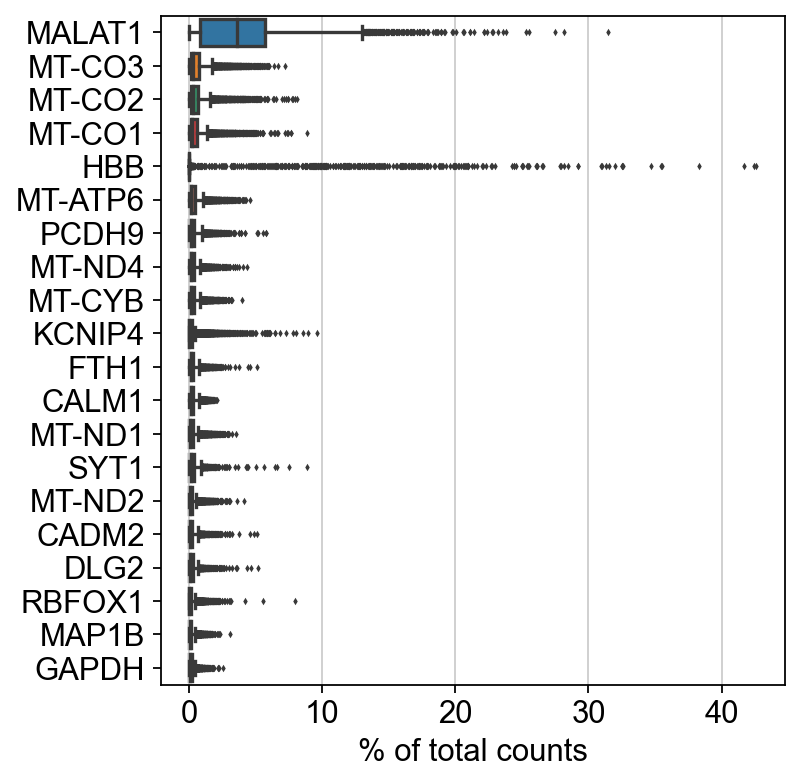

In [25]:
sc.pl.highest_expr_genes(adata, n_top=20, )

Filtering out cells with little genes and genes that are expressed in less than 3 cells.

In [26]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 4 cells that have less than 200 genes expressed
filtered out 6918 genes that are detected in less than 3 cells


Calculate QC metrics.

In [27]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

Plot QC metrics.

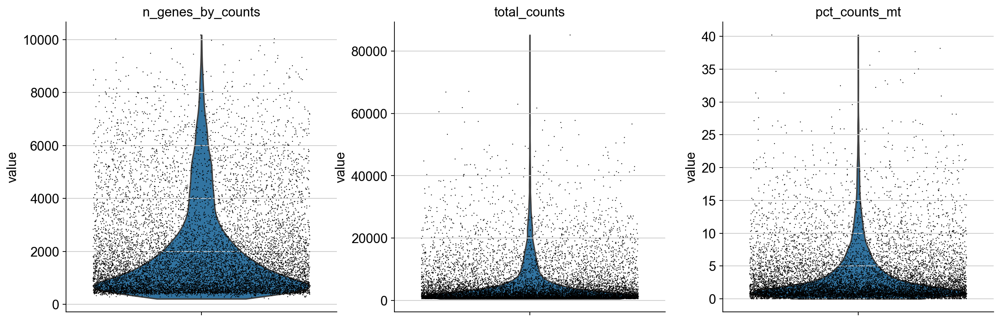

In [28]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

Check for the probable cutoffs used in the dataset by the previous MS analysis. For mitochondria 10% was used. Then plot the metrics in scatter plots.

In [29]:
print(obs_meta_all_gx38["pct_counts_mt"].max())
print(obs_meta_all_gx38["n_genes_by_counts"].max())

9.975669
9034


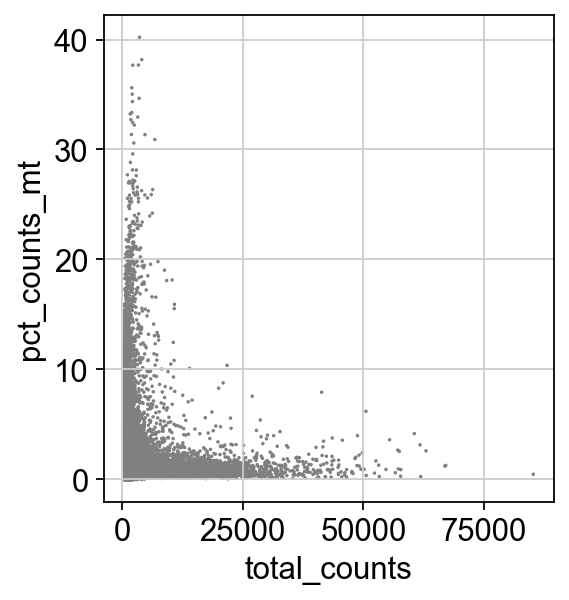

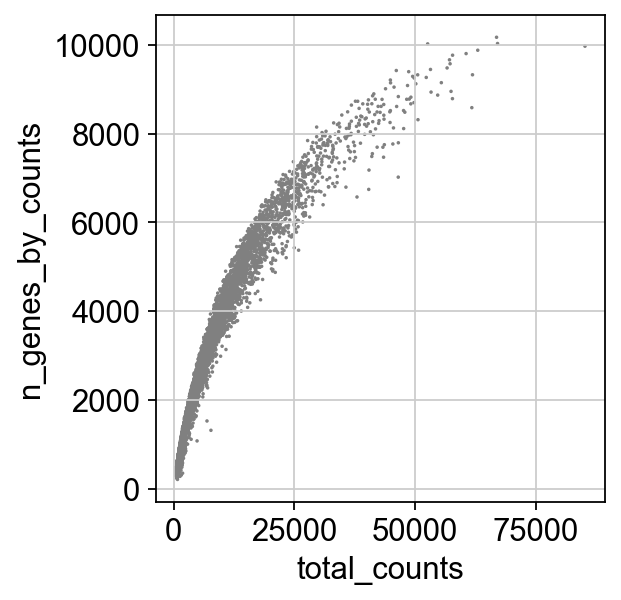

In [30]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [31]:
print("min max n_genes by counts in paper's metadata")
print(obs_meta_all_gx38['n_genes_by_counts'].min(),obs_meta_all_gx38['n_genes_by_counts'].max())
print("min max total counts in paper's metadata")
print(obs_meta_all_gx38['total_counts'].min(),obs_meta_all_gx38['total_counts'].max())

min max n_genes by counts in paper's metadata
308 9034
min max total counts in paper's metadata
701.0 64015.0


In [32]:
print("min max n_genes by counts in new analysis")
print(adata.obs['n_genes_by_counts'].min(),adata.obs['n_genes_by_counts'].max())
print("min max total counts in new analysis")
print(adata.obs['total_counts'].min(),adata.obs['total_counts'].max())

min max n_genes by counts in new analysis
208 10169
min max total counts in new analysis
498.0 85193.0


Exclude cells with higher n_genes_by_counts and pct_counts_mt than seen in the paper.

In [33]:
adata = adata[adata.obs.n_genes_by_counts < 10849, :] # adjusted 2500 to 10894 by previous analysis
adata = adata[adata.obs.pct_counts_mt < 10, :] # under 10 percent as cutoff

Run normalization with a target of 10,000.

In [34]:
sc.pp.normalize_total(adata, target_sum=1e4)

/Users/fabiola.curion/Documents/devel/miniconda3/envs/panpipes_py39/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


Apply logarithmic transformation.

In [35]:
sc.pp.log1p(adata)

Plot highly variable genes.

In [36]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


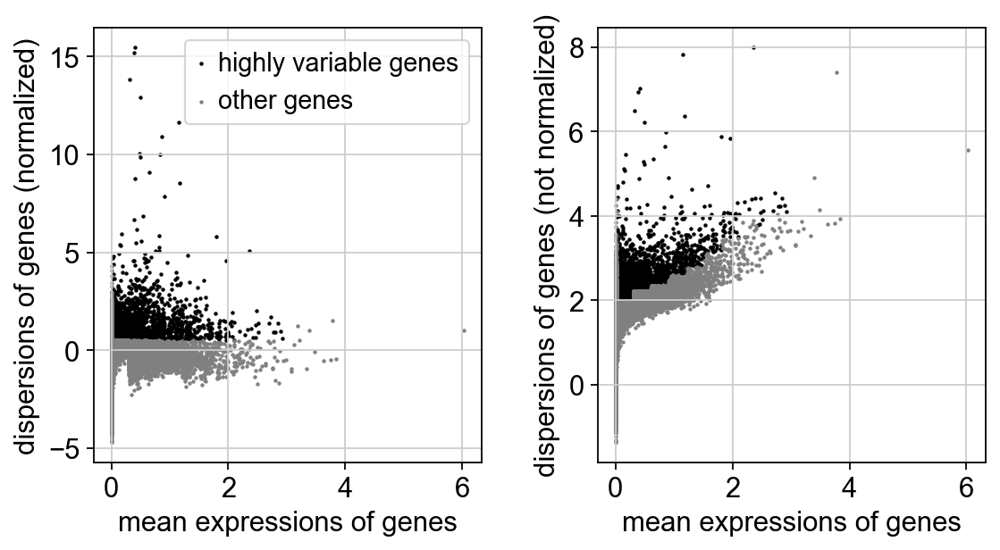

In [37]:
sc.pl.highly_variable_genes(adata)

Add adata to adata.raw

In [38]:
adata.raw = adata

Include only highly variable genes.

In [39]:
adata = adata[:, adata.var.highly_variable]

Regress out by total_counts and pct_counts_mt.

In [40]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:01:17)


Scaling of the gene expression data.

In [41]:
sc.pp.scale(adata, max_value=10)

Perform principal component analysis. And plot PCAs.

In [42]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


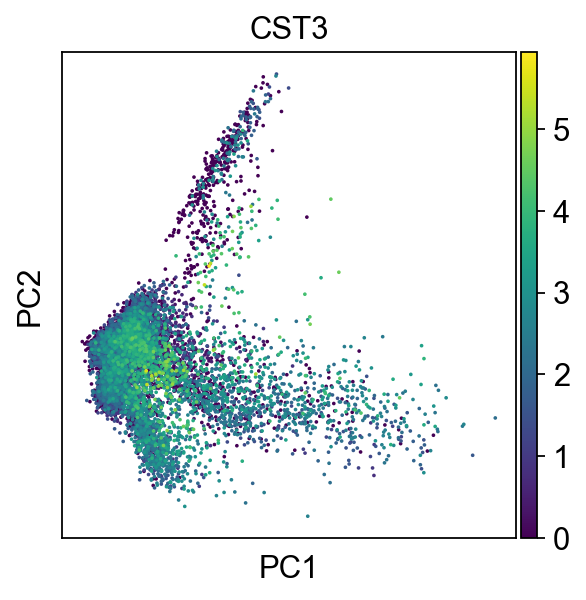

In [43]:
sc.pl.pca(adata, color='CST3')

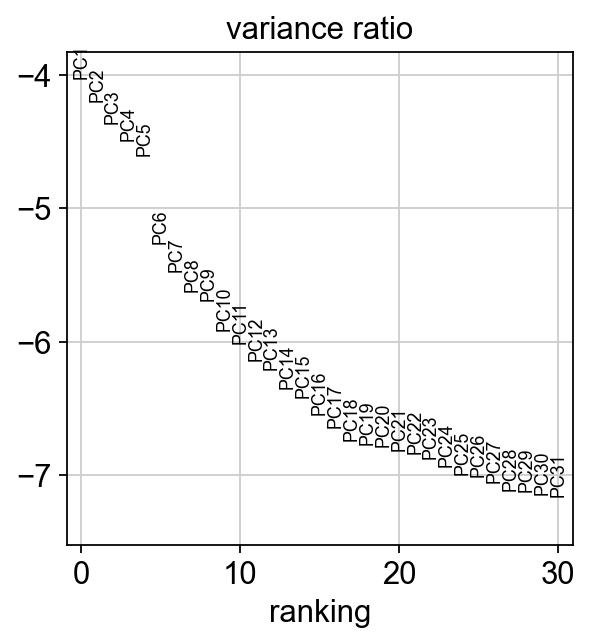

In [44]:
sc.pl.pca_variance_ratio(adata, log=True)

In [45]:
adata

AnnData object with n_obs × n_vars = 11021 × 6190
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets', 'doublet_classification_pipeline', 'doublet_score', 'predicted_doublets', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

Compute the neighborhood graph.

In [46]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:15)


Perform dimensionality reduction by UMAP.

In [47]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


Leiden Cluster in different resolutions.

In [48]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 29 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


In [49]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)
sc.tl.leiden(adata, key_added="leiden_res2", resolution=2.0)

running Leiden clustering
    finished: found 14 clusters and added
    'leiden_res0_25', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden_res0_5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 29 clusters and added
    'leiden_res1', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 37 clusters and added
    'leiden_res2', the cluster labels (adata.obs, categorical) (0:00:02)


Plot some QC and donor identity UMAPs.

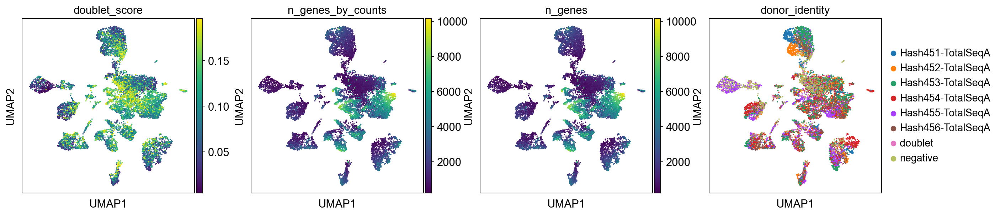

In [50]:
sc.pl.umap(adata, color=['doublet_score', 'n_genes_by_counts', 'n_genes', 'donor_identity'])

Add a column to adata.obs that only shows doublet vs. no doublet.

In [51]:
doublet_boolean = adata.obs['donor_identity'].str.contains("doublet")
adata.obs['doublet_classification_pipeline'] = ['doublet' if result else 'no doublet' for result in doublet_boolean]

In [52]:
adata.obs

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets,doublet_classification_pipeline,...,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,leiden_res0_25,leiden_res0_5,leiden_res1,leiden_res2
AAACCCAAGGATGAGA-1,Hash454-TotalSeqA,donor0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,...,461,461,623.0,40.0,6.420546,3,0,0,3,1
AAACCCAAGGTACCTT-1,negative,unassigned,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,...,452,452,564.0,24.0,4.255319,5,5,4,5,3
AAACCCAAGTTGGAGC-1,Hash453-TotalSeqA,donor3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,...,2775,2775,5384.0,161.0,2.990342,4,3,3,4,10
AAACCCACAAGGCTTT-1,Hash453-TotalSeqA,donor3,SmoothMusc-ACTA2hi_CNN1pos,Endo,761433_GX38,endothelial,ms,0.090532,False,no doublet,...,834,834,1146.0,55.0,4.799302,19,4,11,19,23
AAACCCACACACAGCC-1,Hash453-TotalSeqA,donor3,CUX2_PALMDpos_FREM3pos,CUX2,761433_GX38,neurons,ms,0.041888,False,no doublet,...,8249,8249,44800.0,206.0,0.459821,13,1,1,13,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGTCCACTTTA-1,Hash453-TotalSeqA,donor3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,...,1919,1919,3421.0,342.0,9.997077,3,0,0,3,24
TTTGTTGTCCCTCTAG-1,Hash455-TotalSeqA,donor1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,...,1123,1123,2605.0,3.0,0.115163,11,6,9,11,11
TTTGTTGTCCGTACGG-1,Hash456-TotalSeqA,donor5,OG - OPALINhi_PLXDC2hi,OG - OPALINhi_PLXDC2hi,761433_GX38,oligodendrocytes,ms,0.033449,False,no doublet,...,2092,2092,3912.0,13.0,0.332311,0,2,2,0,2
TTTGTTGTCGCTTGAA-1,Hash456-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,...,680,680,867.0,32.0,3.690888,1,0,0,1,0


Plot some QC parameter and doublet identification by Hadge parameters UMAPs.

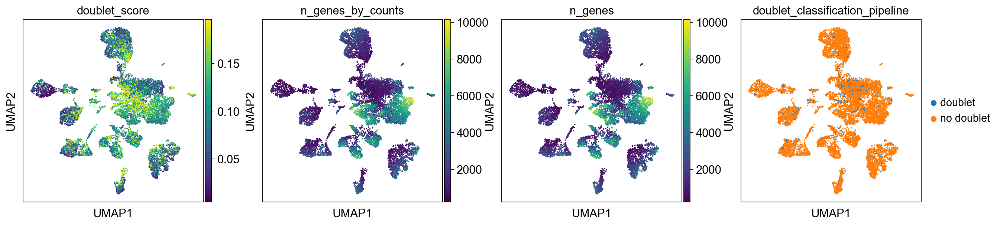

In [53]:
sc.pl.umap(adata, color=['doublet_score', 'n_genes_by_counts', 'n_genes', 'doublet_classification_pipeline'])

Generating a column that labels all NaN cells in the bucket column as new. Then combine these with the leiden_clustering.

In [54]:
adata.obs['newold'] = np.where(pd.isna(adata.obs['bucket']), 'new', 'old')
adata.obs["leiden_new_old"]=adata.obs['leiden'].str.cat(adata.obs['newold'], sep='_')
adata.obs["leiden_res0_25_new_old"]=adata.obs['leiden_res0_25'].str.cat(adata.obs['newold'], sep='_')

Turning NaN cells in to "New cells" in the adata.obs.

In [55]:
adata.obs["coarse_id"] = adata.obs["bucket"]
adata.obs["coarse_id"] = adata.obs["coarse_id"].astype("string")


adata.obs["coarse_id"][adata.obs["coarse_id"].isna()]="New cells"
adata.obs["coarse_id"]=adata.obs["coarse_id"].astype("category")
adata.obs["coarse_id"].cat.categories

Index(['New cells', 'astrocytes', 'cd74', 'endothelial', 'neurons',
       'oligodendrocytes'],
      dtype='string')

Plotting the cell type description the paper gave over all cells including the new ones to identify clusters.

In [56]:
color_palette =dict(zip(['New cells', 'astrocytes', 'cd74', 'endothelial', 'neurons','oligodendrocytes']
    ,['#f54284', '#CCBB44', '#228833', '#4477AA', '#66CCEE', '#75375a']))

custom_order = ['astrocytes', 'cd74', 'endothelial', 'neurons','oligodendrocytes','New cells' ]
adata.obs["coarse_id"].cat.reorder_categories(custom_order, inplace=True)

/var/folders/q1/jqpy4lk14cg0950t1mfrcf7cw66yvr/T/ipykernel_34806/2776424453.py:5: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs["coarse_id"].cat.reorder_categories(custom_order, inplace=True)


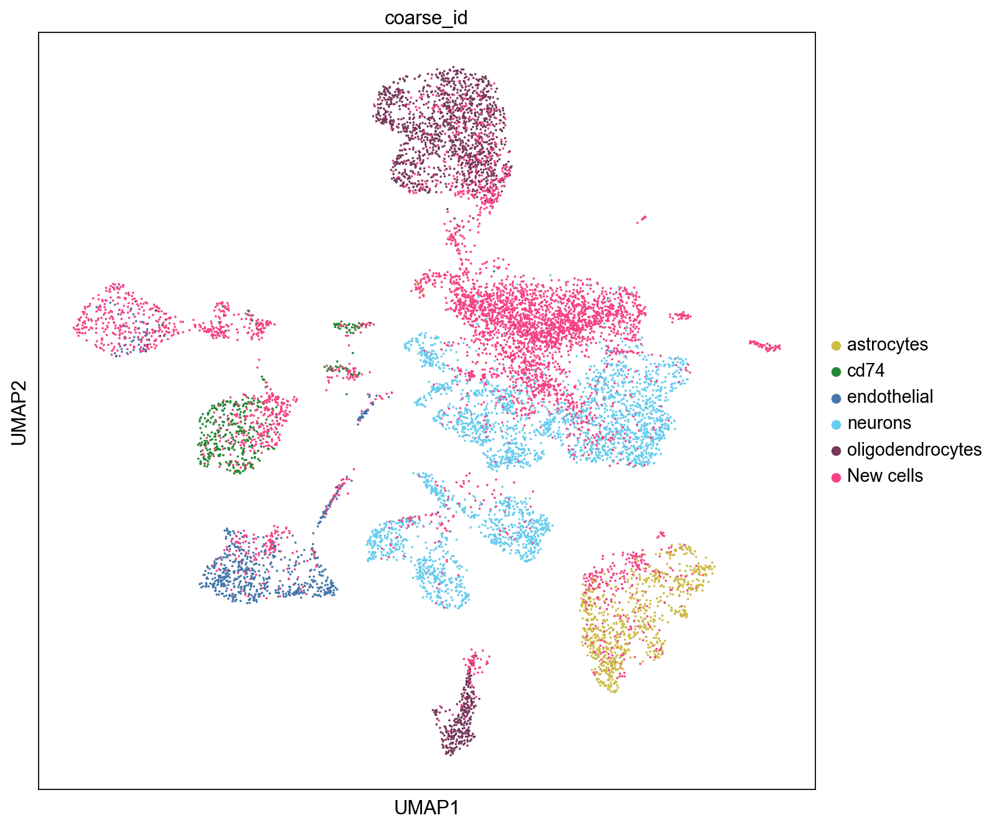

In [57]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 10))
plt.show(sc.pl.umap(adata, color=["coarse_id"], palette = color_palette,ax=ax))

Saving the UMAP above.

In [58]:
fig_save="gx38_final"
if not os.path.exists(fig_save):
    os.mkdir(fig_save)
sc.settings.figdir=fig_save
sc.settings.set_figure_params(dpi_save=300, figsize=(7,7))


Excluding cells that had no donor_id and plot them.

                       donor_identity donor_id               cluster_label  \
AAACCCAAGGATGAGA-1  Hash454-TotalSeqA   donor0                         NaN   
AAACCCAAGTTGGAGC-1  Hash453-TotalSeqA   donor3                         NaN   
AAACCCACAAGGCTTT-1  Hash453-TotalSeqA   donor3  SmoothMusc-ACTA2hi_CNN1pos   
AAACCCACACACAGCC-1  Hash453-TotalSeqA   donor3      CUX2_PALMDpos_FREM3pos   
AAACCCACATATCTGG-1  Hash454-TotalSeqA   donor0                         NaN   
...                               ...      ...                         ...   
TTTGTTGTCCACTTTA-1  Hash453-TotalSeqA   donor3                         NaN   
TTTGTTGTCCCTCTAG-1  Hash455-TotalSeqA   donor1                         NaN   
TTTGTTGTCCGTACGG-1  Hash456-TotalSeqA   donor5      OG - OPALINhi_PLXDC2hi   
TTTGTTGTCGCTTGAA-1  Hash456-TotalSeqA   donor5                         NaN   
TTTGTTGTCGTAACTG-1  Hash456-TotalSeqA   donor5      OG - OPALINhi_PLXDC2hi   

                      lowres_cluster_label    sample_id        

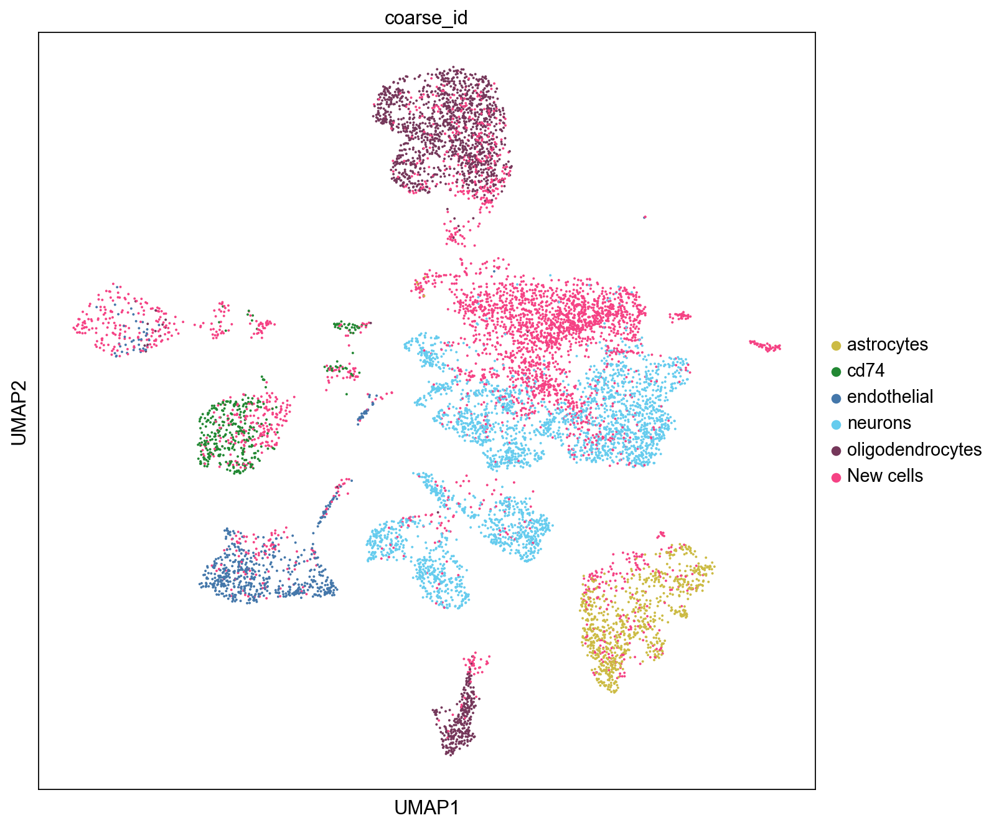

In [59]:
adata_donor_assigned = adata[~(adata.obs['donor_identity'] == 'negative'), :]
print(adata_donor_assigned.obs)
fig, ax = plt.subplots(figsize=(10, 10))
plt.show(sc.pl.umap(adata_donor_assigned, color=["coarse_id"], ax=ax))

Used Hadge pipeline's doublet prediction to filter out doublets and rerun PCA, UMAP and different Leiden resolutions.

View of AnnData object with n_obs × n_vars = 9095 × 6190
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets', 'doublet_classification_pipeline', 'doublet_score', 'predicted_doublets', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'newold', 'leiden_new_old', 'leiden_res0_25_new_old', 'coarse_id'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'donor_identity_colors', 'doublet_classification_pipeline_colors', 'coarse_id_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'
computing PCA
    on highly variabl

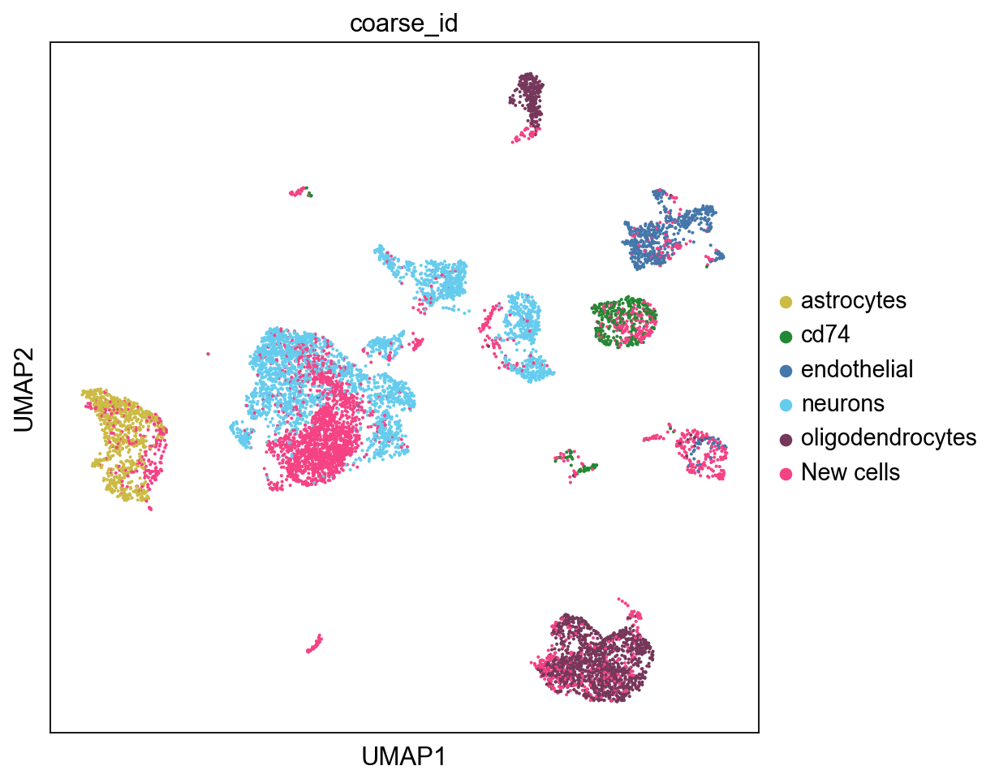

running Leiden clustering
    finished: found 16 clusters and added
    'leiden_r0_25', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_r0_5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 30 clusters and added
    'leiden_r1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 43 clusters and added
    'leiden_r2', the cluster labels (adata.obs, categorical) (0:00:00)


In [60]:
adata_donor_assigned_no_doublets = adata_donor_assigned[~(adata_donor_assigned.obs['donor_identity'] == 'doublet'), :]
print(adata_donor_assigned_no_doublets)

sc.tl.pca(adata_donor_assigned_no_doublets)
sc.tl.umap(adata_donor_assigned_no_doublets)
sc.pl.umap(adata_donor_assigned_no_doublets, color="coarse_id",palette= color_palette)

sc.tl.leiden(adata_donor_assigned_no_doublets, key_added="leiden_r0_25", resolution=0.25)
sc.tl.leiden(adata_donor_assigned_no_doublets, key_added="leiden_r0_5", resolution=0.5)
sc.tl.leiden(adata_donor_assigned_no_doublets, key_added="leiden_r1", resolution=1.0)
sc.tl.leiden(adata_donor_assigned_no_doublets, key_added="leiden_r2", resolution=2.0)


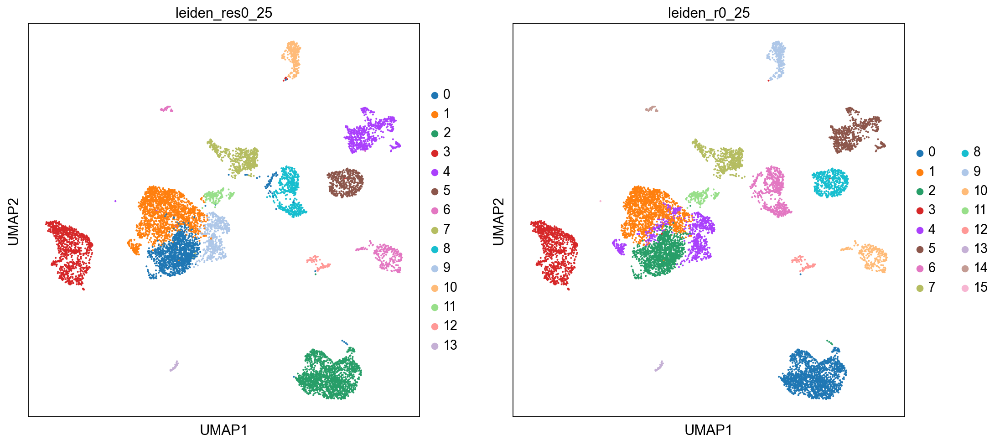

In [61]:
sc.pl.umap(adata_donor_assigned_no_doublets, color=["leiden_res0_25","leiden_r0_25"])

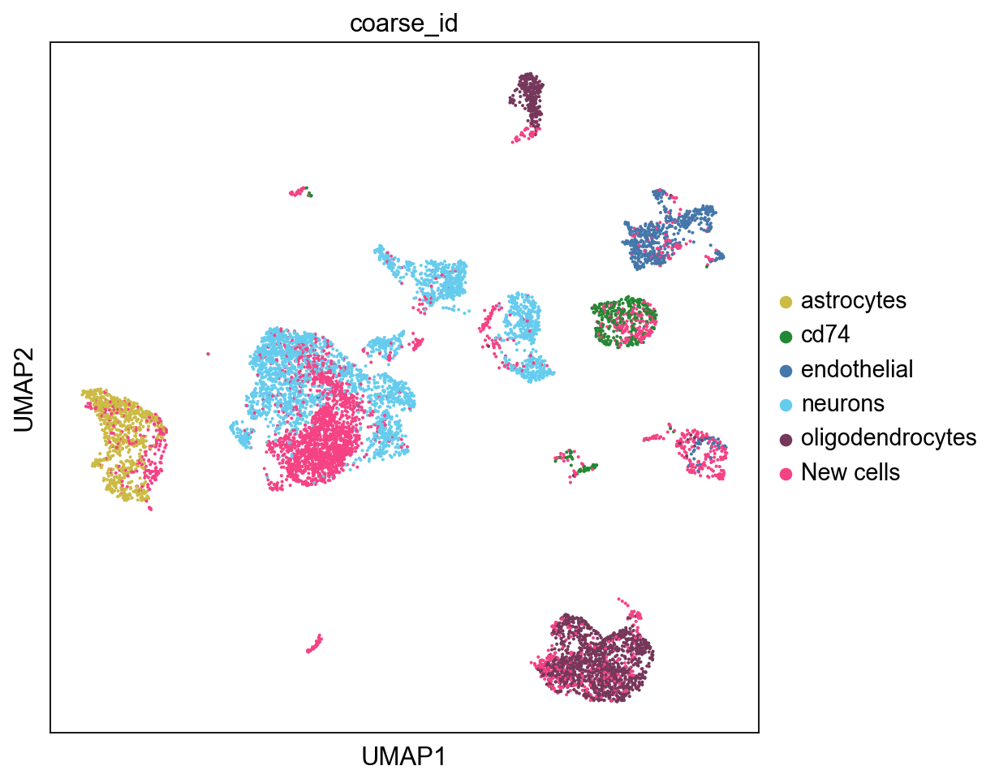

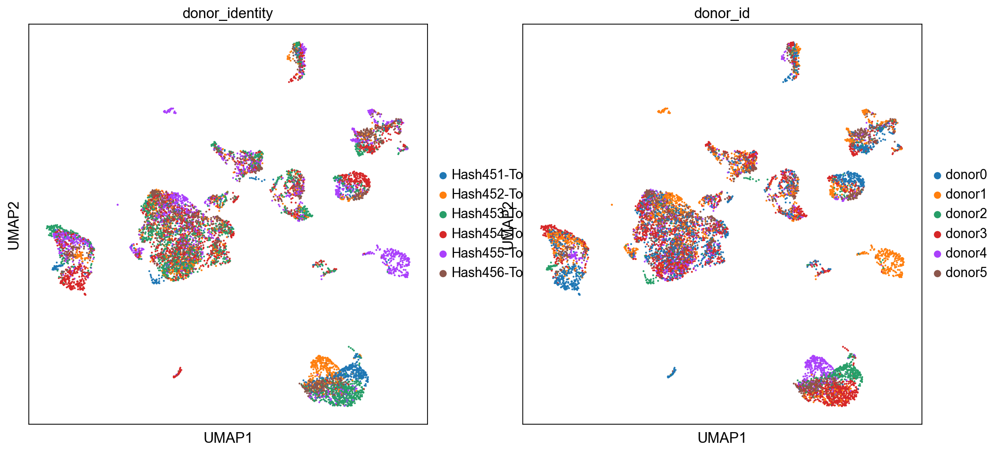

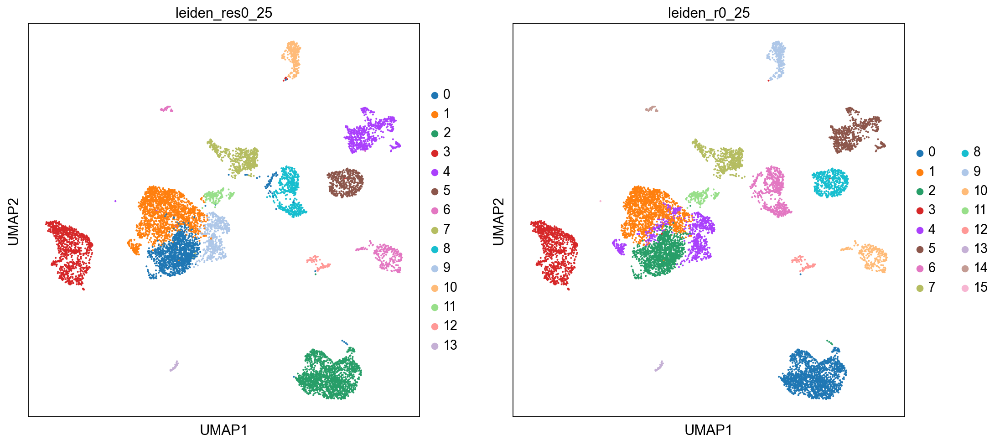

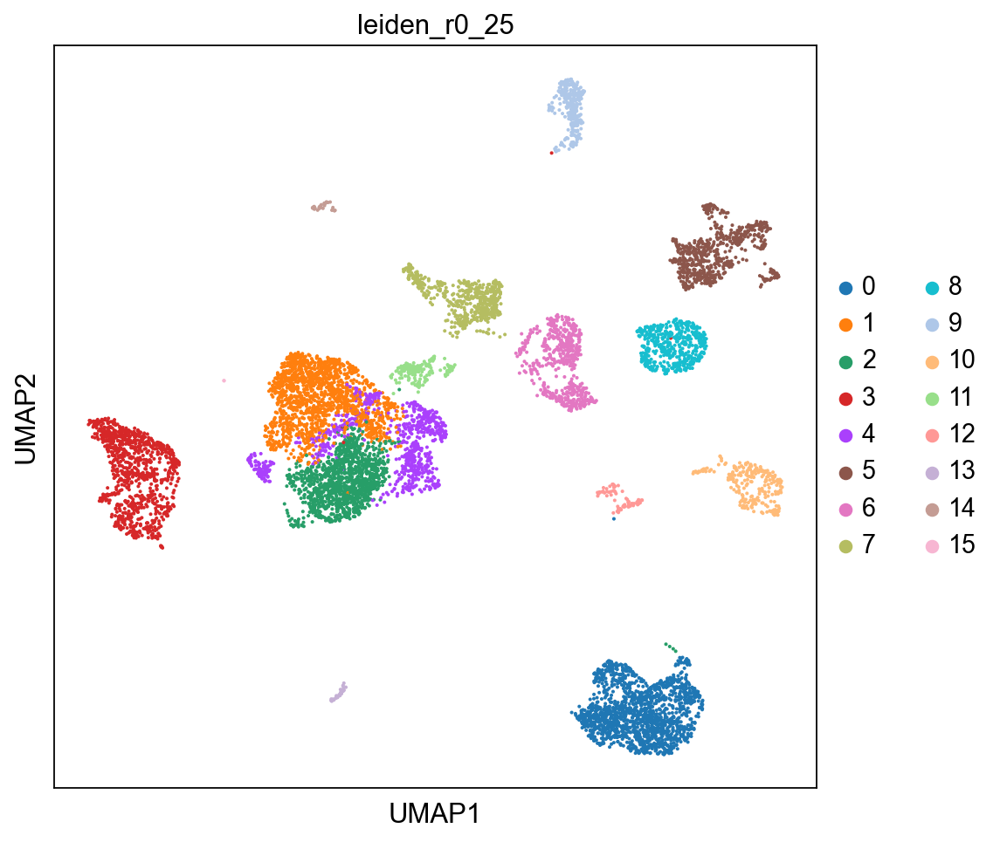

In [62]:
sc.pl.umap(adata_donor_assigned_no_doublets, color=["coarse_id"], palette = color_palette, save = "coarse_id_color.png")
sc.pl.umap(adata_donor_assigned_no_doublets, save=".png", color=["donor_identity", "donor_id"])
sc.pl.umap(adata_donor_assigned_no_doublets, color=["leiden_res0_25","leiden_r0_25"],save ="leiden_compare.png")

sc.pl.umap(adata_donor_assigned_no_doublets, color=["leiden_r0_25"],save ="leiden_use.png")

Plotting doublet and QC parameters after removal of Hadge pipeline predicted doublets and unassigned donors.

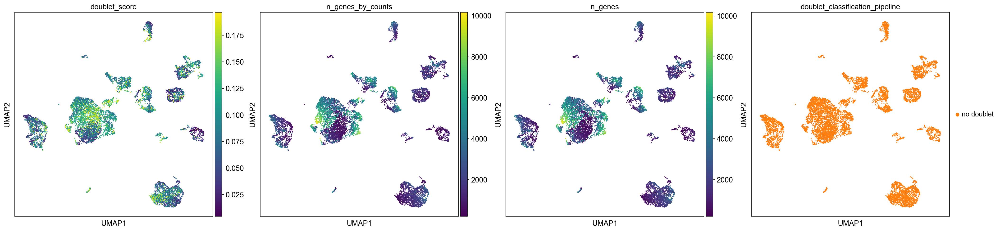

In [63]:
sc.pl.umap(adata_donor_assigned_no_doublets, color=['doublet_score', 'n_genes_by_counts', 'n_genes', 'doublet_classification_pipeline'])

In [64]:
sc.settings.verbosity = 2  # reduce the verbosity

Showing ranked genes by wilcoxon.

ranking genes
    finished (0:00:31)


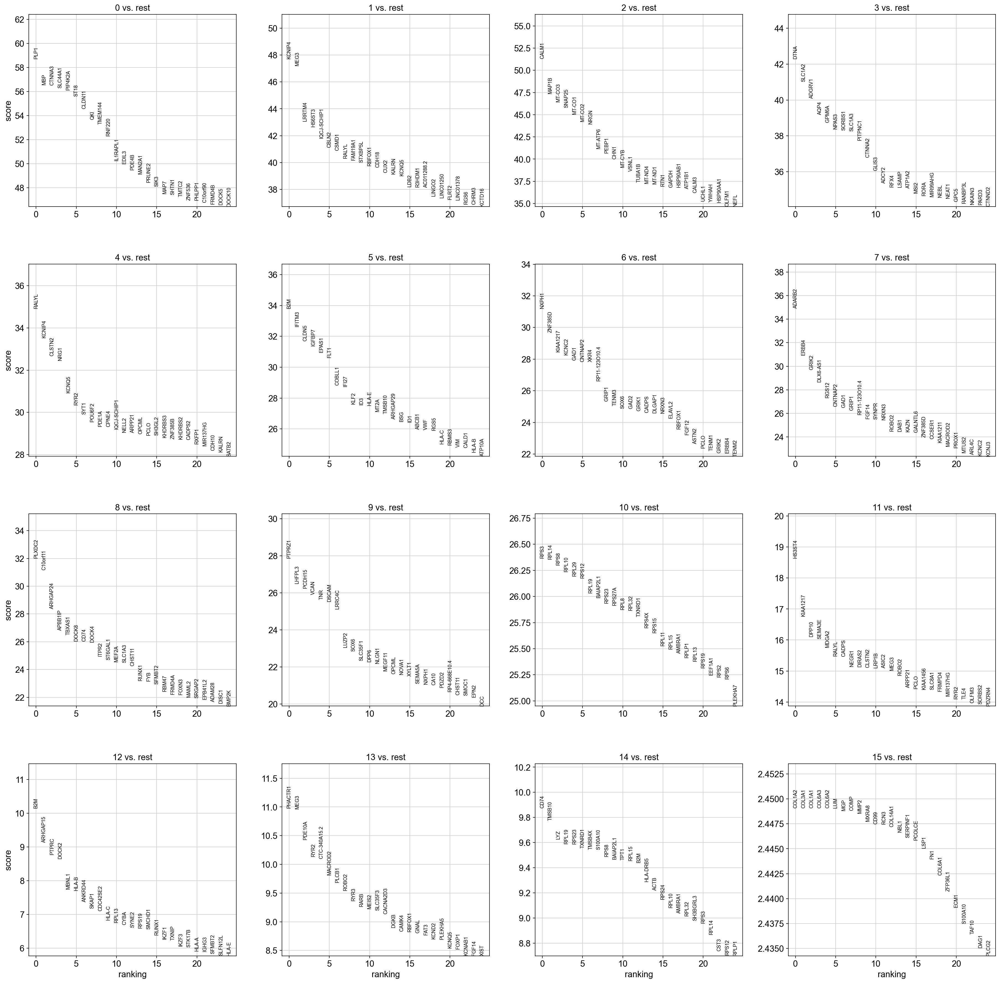

In [65]:
sc.tl.rank_genes_groups(adata_donor_assigned_no_doublets, "leiden_r0_25", method='wilcoxon')
sc.pl.rank_genes_groups(adata_donor_assigned_no_doublets, n_genes=25, sharey=False)

Plotting UMAPs of highest ranked genes for Cluster 2.

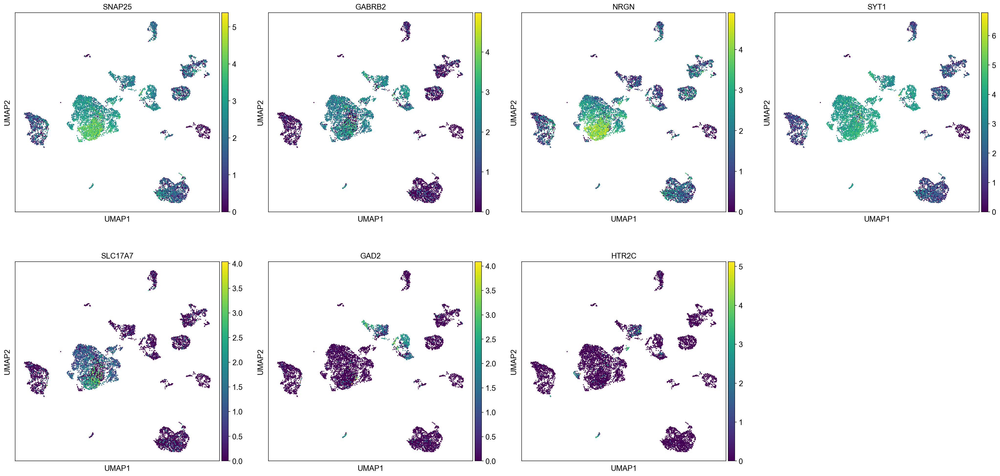

In [66]:
sc.pl.umap(adata_donor_assigned_no_doublets, color=['SNAP25', "GABRB2", "NRGN", "SYT1", "SLC17A7", "GAD2", "HTR2C"])

Looking more closely at the new leiden cluster 10 with QC parameters. 

In [67]:
cluster_new = adata_donor_assigned_no_doublets.obs[adata_donor_assigned_no_doublets.obs["leiden_r0_25"] == '10']

In [68]:
cluster_new['doublet_score'].describe()

count    239.000000
mean       0.030749
std        0.032166
min        0.004494
25%        0.009731
50%        0.019157
75%        0.038975
max        0.190736
Name: doublet_score, dtype: float64

Plot cells in dotplot with some neuronal markers.

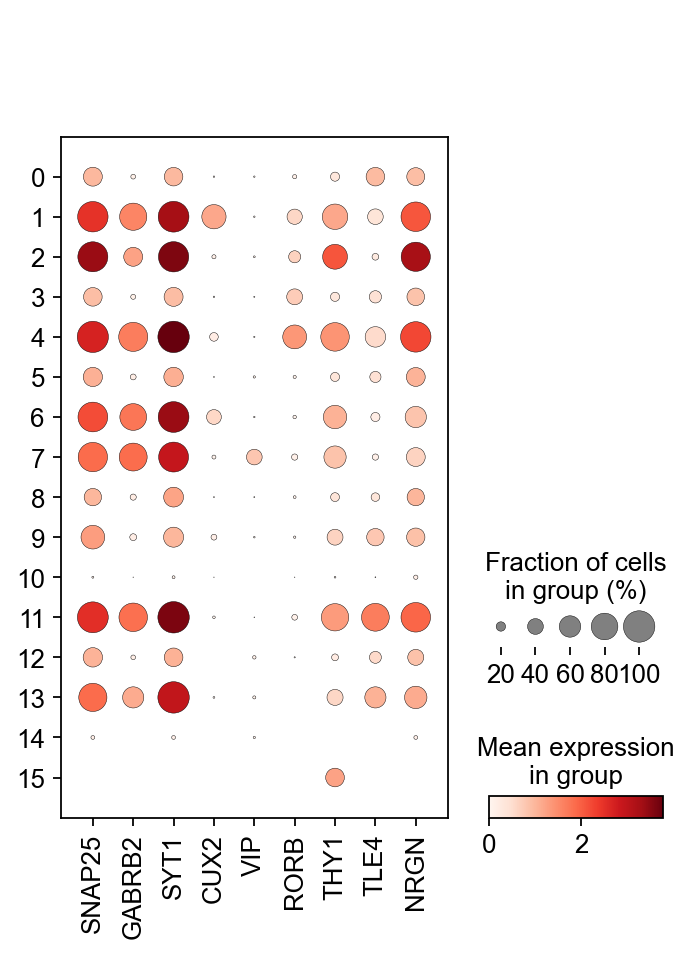

In [69]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, ["SNAP25", "GABRB2", "SYT1", "CUX2", "VIP", "RORB", "THY1", "TLE4", "NRGN"], groupby='leiden_r0_25')

Plotting a small overview of all leiden 0.25 clusters with 3 dotplots with different genes included.

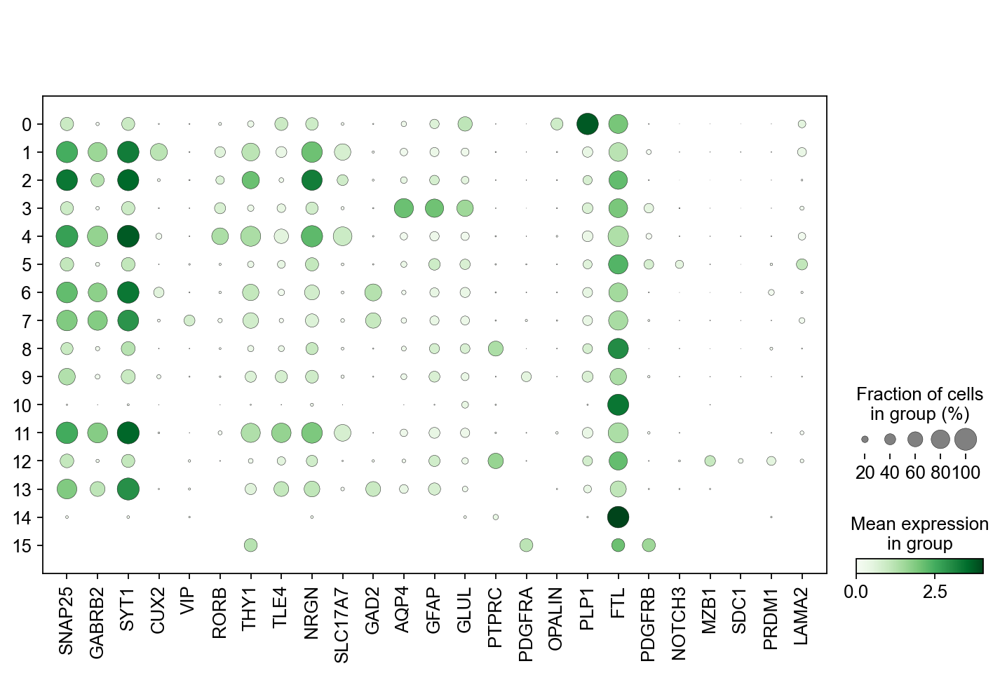

In [70]:
gene_sel=["SNAP25","GABRB2","SYT1","CUX2","VIP",
"RORB","THY1","TLE4","NRGN","SLC17A7",
"GAD2","AQP4","GFAP","GLUL","PTPRC",
"PDGFRA","OPALIN","PLP1","FTL","PDGFRB",
"NOTCH3","MZB1","SDC1","PRDM1","LAMA2"]
sc.pl.dotplot(adata_donor_assigned_no_doublets, gene_sel,
                                                 color_map='Greens',groupby='leiden_r0_25')

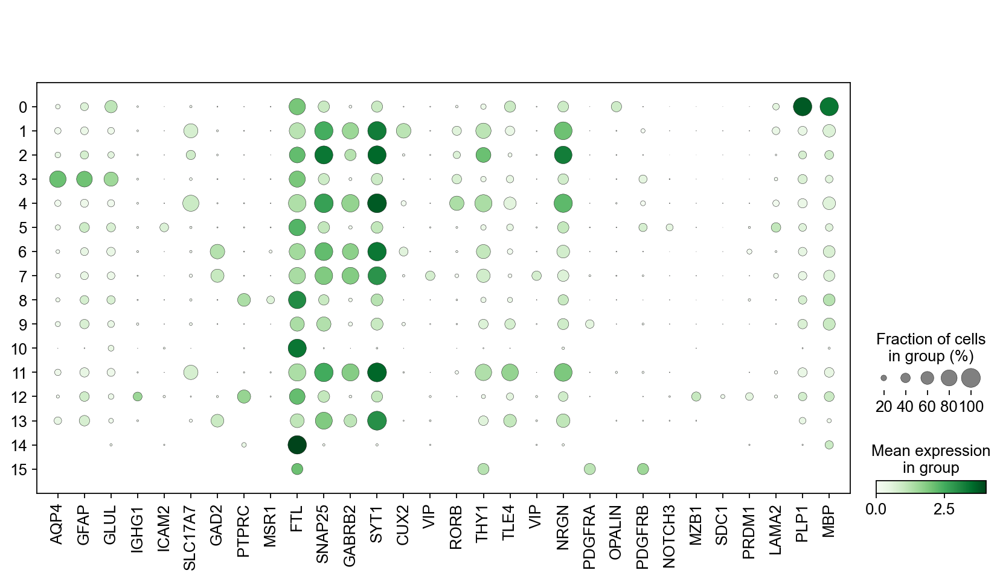

In [71]:
gene_sel2=["AQP4","GFAP","GLUL","IGHG1","ICAM2","SLC17A7","GAD2","PTPRC","MSR1","FTL",
           "SNAP25","GABRB2","SYT1","CUX2","VIP","RORB","THY1","TLE4","VIP","NRGN","PDGFRA",
           "OPALIN","PDGFRB","NOTCH3","MZB1","SDC1","PRDM1","LAMA2","PLP1","MBP"]
sc.pl.dotplot(adata_donor_assigned_no_doublets, gene_sel2,
                                                 color_map='Greens', groupby='leiden_r0_25')

Big overview for cell Markers.

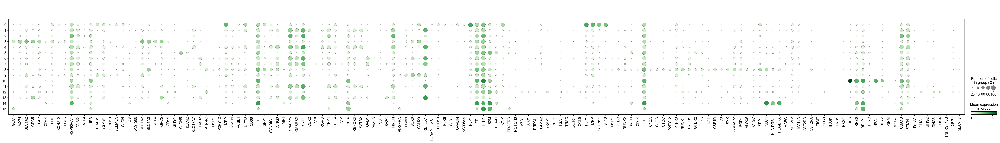

In [72]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, ['GJA1', 'AQP4', 'SLC1A2', 'GPC5', 'GFAP',
'CD44', 'GLUL', 'KCNJ10', 'BCL6', 'HSP90AA1',
'FAIM2', 'ATF4', 'UBB', 'BCAS1', 'SGMS1',
'KCNJ10', 'SEMA6A', 'GLDN', 'FOS', 'LINC01088',
'SLC1A2', 'SLC1A3', 'RFX4', 'GPC5', 'CD44',
'IGHG1', 'CLDN5', 'ICAM2', 'SLC17A7', 'GAD2',
'PTPRC', 'MSR1', 'P2RY12', 'MBP', 'ASAH1',
'ACSL1', 'DPYD', 'CD68', 'FTL', 'SPP1',
'SYNDIG1', 'KCNQ3', 'AIF1', 'SNAP25', 'GABRB2',
'SYT1', 'CUX2', 'VIP', 'RORB', 'THY1',
'TLE4', 'VIP', 'PPIA', 'RBFOX3', 'SATB2',
'GAD1', 'PVALB', 'SST', 'SV2C', 'NRGN',
'PDGFRA', 'BCAN', 'SOX6', 'CDH20', 'RBFOX1',
'LURAP1L-AS1', 'CDH19', 'KLK6', 'GJB1', 'OPALIN',
'LINC00844', 'PLP1',
'FTL', 'FTH1', 'B2M', 'HLA-C', 'CNP',
'PDGFRB', 'NOTCH3', 'MZB1', 'SDC1', 'PRDM1',
'LAMA2', 'SKAP1', 'PRF1', 'ITGA4', 'TRAC',
'CXCR4', 'CCL5', 'PLP1', 'MBP', 'CLDN11',
'ST18', 'MSR1', 'TFEC', 'RUNX2', 'SRGN',
'CD14', 'FTL', 'C1QA', 'C1QB', 'C1QC',
'P2RY12', 'PTPRJ', 'RUNX1', 'BACH1',
'TGFBR2', 'IFI16', 'IL18', 'CSF1R', 'C3',
'SYK', 'SRGAP2', 'FGD4', 'ALOX5',
'CTSC', 'SPP1', 'CD74', 'HLA-DRB1',
'HLA-DRA', 'MAFG', 'NFE2L2',
'MAT2A', 'CSF2RB', 'CSF2RA',
'TIGIT', 'CD69', 'IL23R', 'KLRB1', 'HBG2', 'HBB', 'RPS6',
'RPLP1', 'TFRC', 'HBA1', 'HBA2', 'IGHM',
'MKI67', 'TUBA1B', 'STMN1', 'IGHA1', 'IGHG1',
'IGHG2', 'IGHG3', 'IGHG4', 'TNFRSF13B', 'XBP1', 'SLAMF7']

                                                , color_map='Greens', groupby='leiden_r0_25')

In [73]:
adata_donor_assigned_no_doublets.obs['newold'] = np.where(pd.isna(adata_donor_assigned_no_doublets.obs['bucket']), 'new', 'old')
#rename new old based on new leiden resolution r0_25
adata_donor_assigned_no_doublets.obs["leiden_res0_25_new_old"]=adata_donor_assigned_no_doublets.obs['leiden_r0_25'].str.cat(adata_donor_assigned_no_doublets.obs['newold'], sep='_')

Showing dotplots comparing new and old cells.

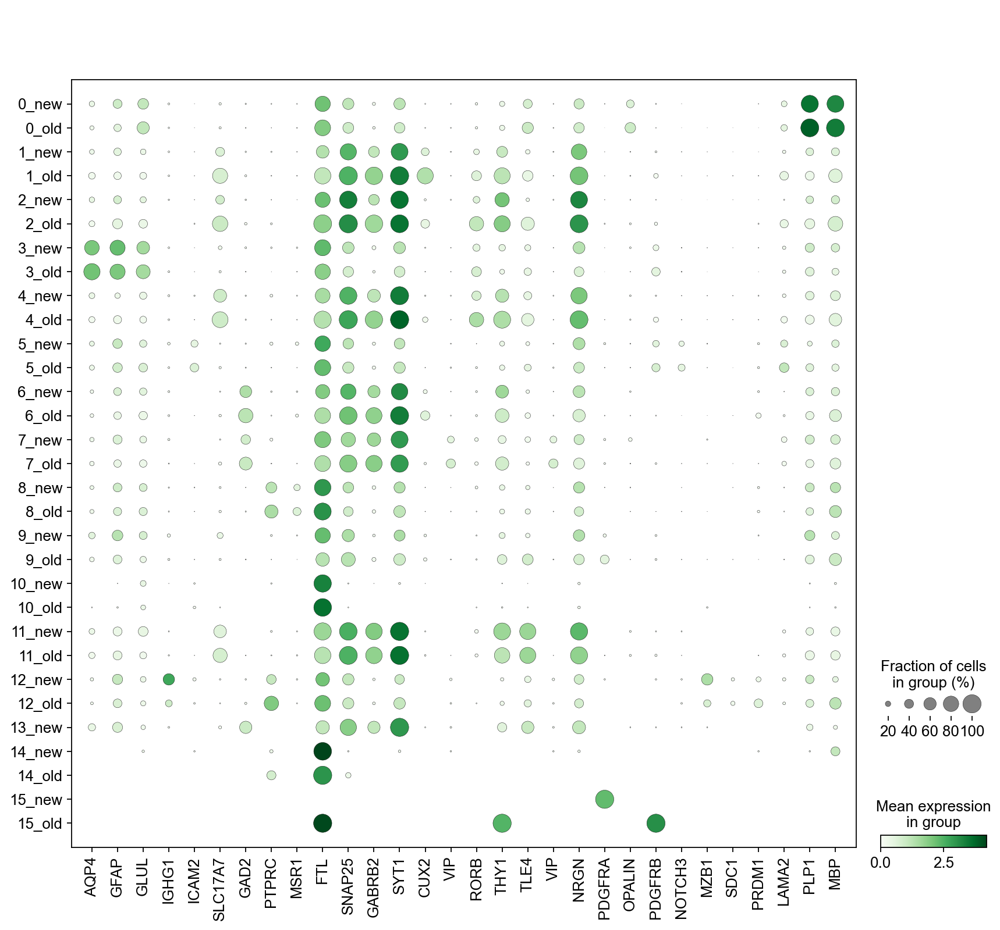

In [74]:
marker_genes = ["AQP4","GFAP","GLUL","IGHG1","ICAM2",
"SLC17A7","GAD2","PTPRC","MSR1","FTL","SNAP25",
"GABRB2","SYT1","CUX2","VIP","RORB","THY1",
"TLE4","VIP","NRGN","PDGFRA","OPALIN",
"PDGFRB","NOTCH3","MZB1","SDC1","PRDM1",
"LAMA2","PLP1","MBP"]
sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_genes, color_map='Greens', save="new_old_leiden025.png", groupby='leiden_res0_25_new_old')

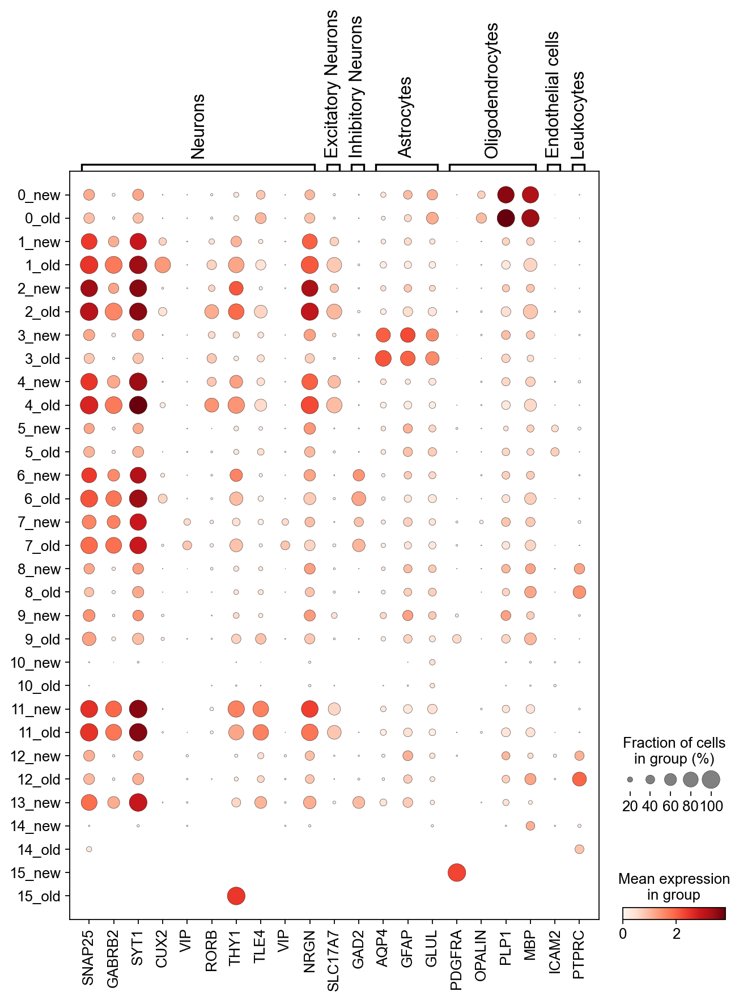

In [75]:
marker_genes_dict = {
    'Neurons': ["SNAP25", "GABRB2", "SYT1", "CUX2", "VIP", "RORB", "THY1", "TLE4", "VIP", "NRGN"],
    'Excitatory Neurons': ['SLC17A7'],
    'Inhibitory Neurons': ['GAD2'],
    'Astrocytes': ["AQP4", "GFAP", "GLUL"],
    'Oligodendrocytes': ["PDGFRA", "OPALIN", "PLP1", "MBP"],
    'Endothelial cells': "ICAM2",
    'Leukocytes': "PTPRC"
}
sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_genes_dict,groupby='leiden_res0_25_new_old', save="leiden_new_old.png")

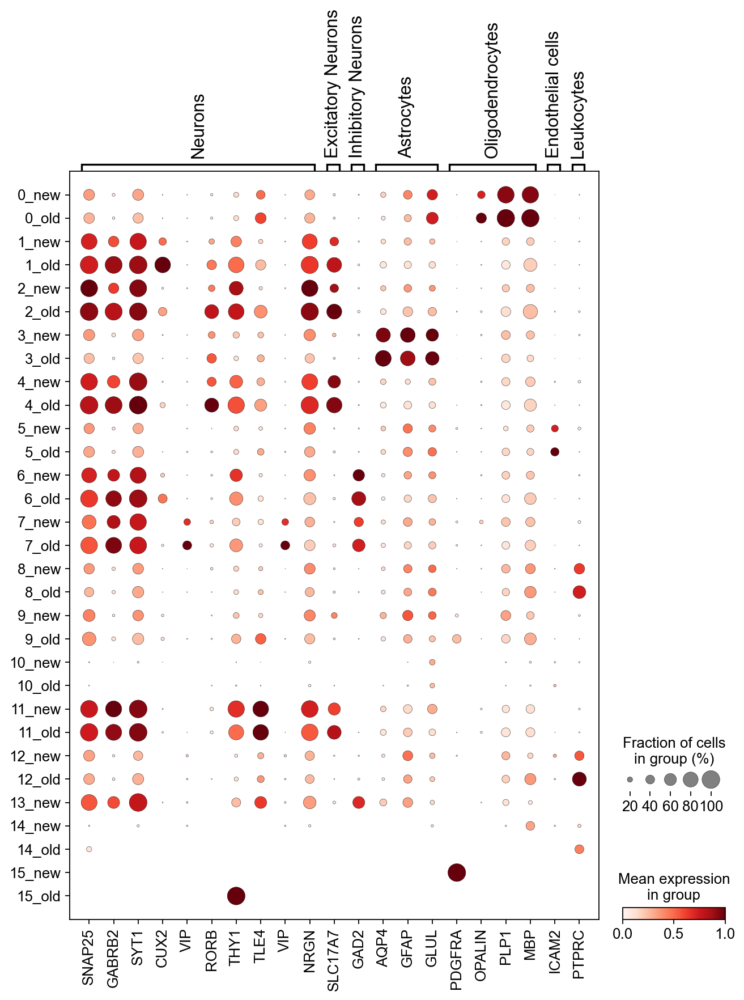

In [76]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_genes_dict,groupby='leiden_res0_25_new_old', standard_scale = "var",save="_scaled_leiden_new_old.png")

Show the ratio of newly recovered and old cells per cluster.

In [77]:
cell_counts = adata_donor_assigned_no_doublets.obs.groupby(["leiden_r0_25", "newold"]).size().reset_index(name="count")
cell_counts

,leiden_r0_25,newold,count
0,0,new,339
1,0,old,1237
2,1,new,394
3,1,old,1058
4,2,new,1193
5,2,old,40
6,3,new,233
7,3,old,767
8,4,new,95
9,4,old,664


In [78]:
cell_counts_pivot = cell_counts.pivot(index="leiden_r0_25", columns="newold", values="count")
cell_counts_pivot

newold,new,old
leiden_r0_25,,
0,339,1237
1,394,1058
2,1193,40
3,233,767
4,95,664
5,102,584
6,80,446
7,33,485
8,169,306


In [79]:
cell_counts_pivot["new_ratio"] = cell_counts_pivot["new"] / (cell_counts_pivot["new"] + cell_counts_pivot["old"])
cell_counts_pivot

newold,new,old,new_ratio
leiden_r0_25,,,
0,339,1237,0.215102
1,394,1058,0.271350
2,1193,40,0.967559
3,233,767,0.233000
4,95,664,0.125165
5,102,584,0.148688
6,80,446,0.152091
7,33,485,0.063707
8,169,306,0.355789


In [80]:
new_ratio_df = cell_counts_pivot[["new_ratio"]].reset_index()

In [81]:
new_ratio_df

newold,leiden_r0_25,new_ratio
0,0,0.215102
1,1,0.271350
2,2,0.967559
3,3,0.233000
4,4,0.125165
5,5,0.148688
6,6,0.152091
7,7,0.063707
8,8,0.355789
9,9,0.125000


Plot the ratio as a bar plot.

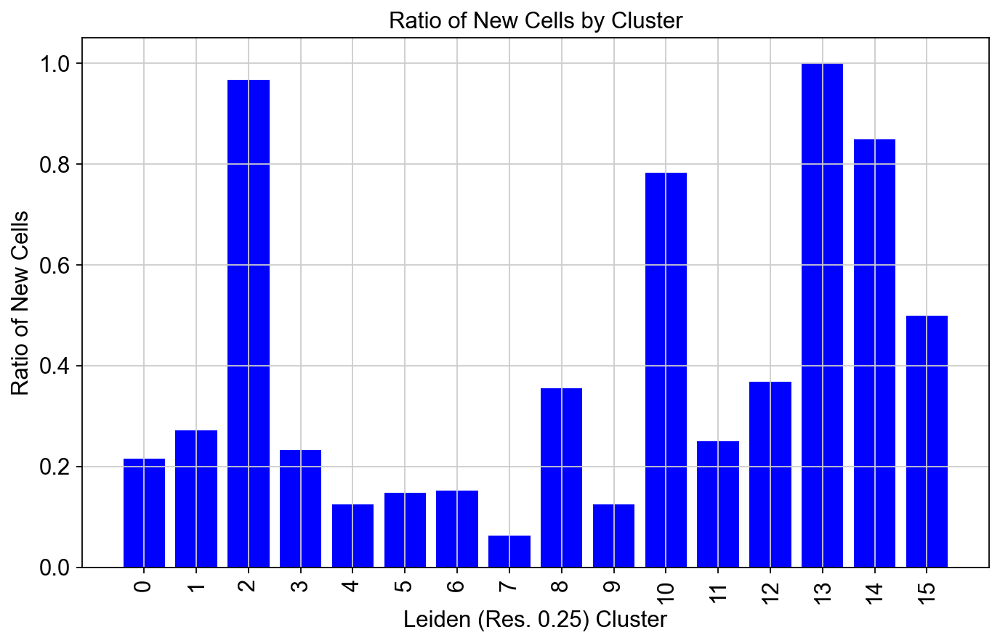

In [82]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

plt.bar(x=new_ratio_df["leiden_r0_25"], height=new_ratio_df["new_ratio"], color="blue")

plt.title("Ratio of New Cells by Cluster")
plt.xlabel("Leiden (Res. 0.25) Cluster")
plt.ylabel("Ratio of New Cells")

plt.xticks(rotation=90)

plt.show()

Get the most prevalent cell type in each cluster, merge the most_prevalent_cell_type dataframe with the new_ratio_df dataframe and sort the merged dataframe based on most_prevalent_cell_type and cluster.

In [83]:
most_prevalent_cell_type = adata_donor_assigned_no_doublets.obs.groupby("leiden_r0_25")["bucket"].agg(lambda x:x.value_counts().index[0]).reset_index()
most_prevalent_cell_type.columns = ["leiden_r0_25", "most_prevalent_cell_type"]

new_ratio_df_merged = new_ratio_df.merge(most_prevalent_cell_type, on="leiden_r0_25")

new_ratio_df_sorted = new_ratio_df_merged.sort_values(by=["most_prevalent_cell_type", "leiden_r0_25"])
new_ratio_df_sorted

,leiden_r0_25,new_ratio,most_prevalent_cell_type
3,3,0.233000,astrocytes
13,13,1.000000,astrocytes
8,8,0.355789,cd74
12,12,0.368421,cd74
14,14,0.848485,cd74
5,5,0.148688,endothelial
10,10,0.782427,endothelial
15,15,0.500000,endothelial
1,1,0.271350,neurons
2,2,0.967559,neurons


Change Cluster 14 to neurons as this is just an artifact bc of completely new cells, then order by name in alphabetical order.

In [84]:
new_ratio_df_sorted.iloc[1, 2] = "neurons"

In [85]:
new_ratio_df_sorted

,leiden_r0_25,new_ratio,most_prevalent_cell_type
3,3,0.233000,astrocytes
13,13,1.000000,neurons
8,8,0.355789,cd74
12,12,0.368421,cd74
14,14,0.848485,cd74
5,5,0.148688,endothelial
10,10,0.782427,endothelial
15,15,0.500000,endothelial
1,1,0.271350,neurons
2,2,0.967559,neurons


In [86]:
new_ratio_df_sorted = new_ratio_df_sorted.sort_values(by=["most_prevalent_cell_type", "leiden_r0_25"])
new_ratio_df_sorted

,leiden_r0_25,new_ratio,most_prevalent_cell_type
3,3,0.233000,astrocytes
8,8,0.355789,cd74
12,12,0.368421,cd74
14,14,0.848485,cd74
5,5,0.148688,endothelial
10,10,0.782427,endothelial
15,15,0.500000,endothelial
1,1,0.271350,neurons
2,2,0.967559,neurons
4,4,0.125165,neurons


Replot the ratio with old cells colored as well and an adjusted color scheme.

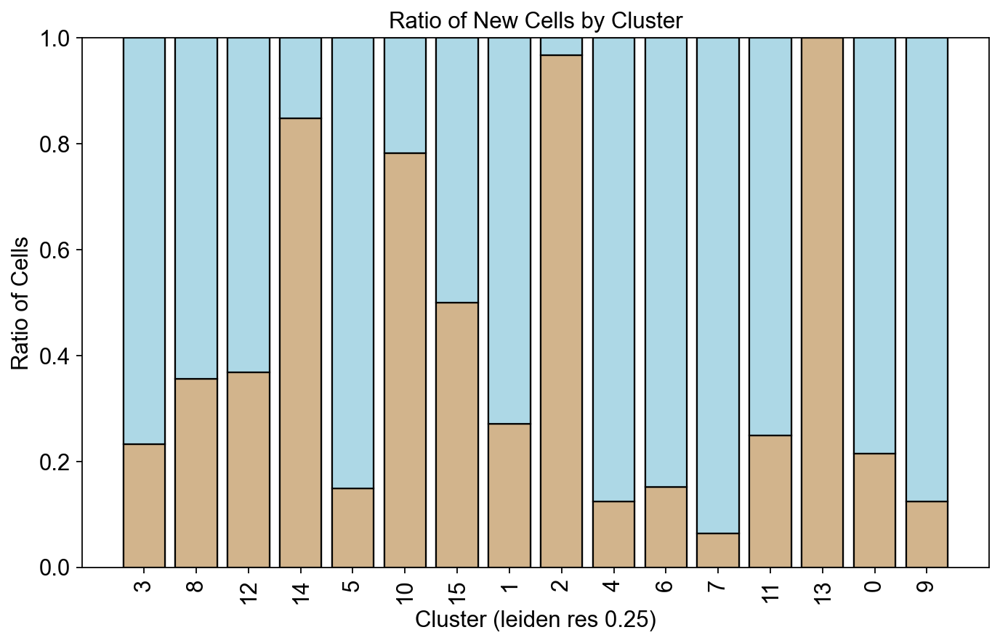

In [87]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
colors = ["#D2B48C", "#ADD8E6"]

plt.bar(x=new_ratio_df_sorted["leiden_r0_25"], height=1, color="#D2B48C", edgecolor="black")
plt.bar(x=new_ratio_df_sorted["leiden_r0_25"], height=new_ratio_df_sorted["new_ratio"], color=colors[0], edgecolor="black")

bottom = new_ratio_df_sorted["new_ratio"]
plt.bar(x=new_ratio_df_sorted["leiden_r0_25"], height=1-new_ratio_df_sorted["new_ratio"], bottom=bottom, color="#ADD8E6", edgecolor="black")

plt.title("Ratio of New Cells by Cluster")
plt.xlabel("Cluster (leiden res 0.25)")
plt.ylabel("Ratio of Cells")

plt.xticks(rotation=90)

plt.grid(False)
plt.savefig("ratio_of_new_cells.png")

plt.show()

Ranking genes by new and old clusters for a spearman's rank correlation analysis.

In [88]:
sc.tl.rank_genes_groups(adata_donor_assigned_no_doublets, groupby='leiden_res0_25_new_old', method='wilcoxon')

ranking genes


ValueError: Could not calculate statistics for groups 15_new, 15_old since they only contain one sample.

In [ ]:
adata_donor_assigned_no_doublets.uns['rank_genes_groups']

In [ ]:
adata_donor_assigned_no_doublets.uns['rank_genes_groups'].keys()
adata_donor_assigned_no_doublets.uns['rank_genes_groups']["names"]['0_old']


In [ ]:
adata_donor_assigned_no_doublets.uns['rank_genes_groups']["names"]['0_new']

In [ ]:
# Extract the DE genes for each cluster
cluster_names = adata_donor_assigned_no_doublets.obs['leiden_res0_25_new_old'].unique()

all_de_genes = pd.DataFrame()

for cluster_name in cluster_names:
    gene_names = adata_donor_assigned_no_doublets.uns['rank_genes_groups']['names'][cluster_name]
    all_de_genes[cluster_name] = gene_names

In [ ]:
all_de_genes.columns

In [ ]:
all_de_genes

In [ ]:
mm =[str(i) for i in range(0, 10) ]
id1 = [x + '_new' for x in mm ]
id2 = [x + '_old' for x in mm ]
idx= id1 + id2
idx
de_genes = all_de_genes[idx]
de_genes

In [ ]:
from scipy.stats import spearmanr
dict_results_01 = {}
for c in idx:
    for a in idx:
        result = spearmanr(de_genes[c][0:100], de_genes[a][0:100])
        dict_results_01[c + ":" + a] = result


In [ ]:
mm =[str(i) for i in range(0, 10) ]
ids=[x + '_new:'+ x +"_old" for x in mm ]

In [ ]:

values = [dict_results_01[name] for name in ids]
values

Plot a density plot of doublet scores of cells detected by hadge in the adata after standard QC.

In [ ]:
import seaborn as sns

numeric_column = 'doublet_score'
group_column = 'doublet_classification_pipeline'

numeric_values = adata.obs[numeric_column]
group_labels = adata.obs[group_column]

df = pd.DataFrame({numeric_column: numeric_values, group_column: group_labels})

sns.kdeplot(data=df, x=numeric_column, hue=group_column, fill=True)

plt.xlabel(numeric_column)
plt.ylabel('Density')
plt.title('Density Plot with Grouped Colors')

plt.show()

lot a density plot of doublet scores of cells grouped by new and old cells.

In [ ]:
numeric_column = 'doublet_score'
group_column = 'newold'

numeric_values = adata_donor_assigned_no_doublets.obs[numeric_column]
group_labels = adata_donor_assigned_no_doublets.obs[group_column]

df = pd.DataFrame({numeric_column: numeric_values, group_column: group_labels})

sns.kdeplot(data=df, x=numeric_column, hue=group_column, fill=True)

plt.xlabel(numeric_column)
plt.ylabel('Density')
plt.title('Density Plot with Grouped Colors')

plt.show()

Rank genes, extract logFC values and show these logFC values as scatter plots comparing old and newly recovered cells in the same cluster.

In [ ]:
adata_old = adata_donor_assigned_no_doublets[(adata_donor_assigned_no_doublets.obs['newold'] == "old"), :]
adata_new = adata_donor_assigned_no_doublets[(adata_donor_assigned_no_doublets.obs['newold'] == "new"), :]

sc.tl.rank_genes_groups(adata_new, groupby='leiden_res0_25_new_old')
results_new = adata_new.uns['rank_genes_groups']

sc.tl.rank_genes_groups(adata_old, groupby='leiden_res0_25_new_old')
results_old = adata_old.uns['rank_genes_groups']

logFC_values_new = pd.DataFrame(results_new['logfoldchanges'])
gene_names_new = pd.DataFrame(results_new['names'])
pvalues_new = pd.DataFrame(results_new['pvals'])
logFC_values_old = pd.DataFrame(results_old['logfoldchanges'])
gene_names_old = pd.DataFrame(results_old['names'])
pvalues_old = pd.DataFrame(results_old['pvals'])

In [ ]:
new_gene_fc = {}
for i in id1:
    df = pd.DataFrame({"gene":gene_names_new[i],"logFC_new": logFC_values_new[i], "pvalues_new": pvalues_new[i]})
    #df.set_index("gene", inplace=True)
    new_gene_fc[i] = df

old_gene_fc = {}
for i in id2:
    df = pd.DataFrame({"gene":gene_names_old[i],"logFC_old": logFC_values_old[i], "pvalues_old": pvalues_old[i]})
    #df.set_index("gene", inplace=True)
    old_gene_fc[i] = df




In [ ]:

for i in mm:
    ddf=pd.merge(old_gene_fc[i+"_old"],new_gene_fc[i+"_new"], on="gene") 
    s_ddf = ddf[(ddf["pvalues_old"]<=0.05) & (ddf["pvalues_new"]<=0.05)]

    result = spearmanr(s_ddf["logFC_old"],s_ddf["logFC_new"])

    plt.scatter(x = "logFC_old", y="logFC_new", data= ddf.head(200))
    plt.xlabel('old LogFC')
    plt.ylabel('new logFC')
    plt.title("Top Markers "+ i + "_new vs" + i+"_old" + " Spearman rho: " + str(round(result[0],2)))
    plt.savefig("TopMarkers"+ i + "_new vs" + i+"_old.png")
    plt.show()





In [ ]:
marker_listoflists = [
    ['AQP4', 'Astrocytes'],
    ['GFAP', 'Astrocytes'],
    ['GLUL', 'Astrocytes'],
    ['SNAP25', 'Neurons'],
    ['GABRB2', 'Neurons'],
    ['SYT1', 'Neurons'],
    ['NRGN', 'Neurons'],
    ['SLC17A7', 'Excitatory neurons'],
    ['GAD2', 'Inhibitory neurons'],
    ['OPALIN', 'Oligodendrocytes'],
    ['PLP1', 'Oligodendrocytes'],
    ['MBP', 'Oligodendrocytes'],
    ['PTPRC', 'Leukocytes'],
    ['IGHG1', 'B-cells'],
    ['MZB1', 'Plasma cells'],
    ['MSR1', 'Macrophages'],
    ['FTL', 'Microglia'],
    ['ICAM2', 'Endothelial cells'],
    ['LAMA2', 'Stromal cells']
]

marker_frame = pd.DataFrame(marker_listoflists, columns=['Marker', 'Cell Type'])

marker_dict = {}
for marker, cell in marker_listoflists:
    if cell not in marker_dict:
        marker_dict[cell] = []
    marker_dict[cell].append(marker)

print(marker_dict)

marker_frame.set_index('Marker', inplace=True)
marker_frame

Plot dotplots with a new arrangement of marker genes in different leiden resolutions and a more thorough leukocyte subsetting.

In [ ]:
marker_genes = ['AQP4', 'GFAP', 'GLUL', 'SNAP25', 'GABRB2', 'SYT1',
                'NRGN', 'SLC17A7', 'GAD2', 'OPALIN', 'PLP1', 'MBP',
                'PTPRC', 'IGHG1',
                'MZB1', 'MSR1', 'FTL', 'ICAM2',
                'LAMA2']

sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_dict, color_map='Blues', groupby='leiden_new_old')

In [ ]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_dict, color_map='Blues', groupby='leiden_r0_25')

Showing CD74 expression next to new and old cells plotted in a UMAP.

In [ ]:
sc.pl.umap(adata_donor_assigned_no_doublets, color=["CD74", "newold"])